<a href="https://colab.research.google.com/github/vitkl/cell2location/blob/master/notebooks/cell2location_short_processing_analysis_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Locating lymph node cell types with tonsil reference from Hamish King et al

Before we do anything, crash colab to ensure it gives you 25 GB of RAM.

In [0]:
d=[]
while(1):
  d.append('1')

First let's setup the environment you need to use `cell2location`.

In [2]:
from google.colab import drive
drive.mount('/content/gdrive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive/


In [0]:
root_path = '/content/gdrive/My Drive/google_colab/cell2location/' 

In [4]:
# First, we install miniconda
!wget https://repo.anaconda.com/miniconda/Miniconda3-latest-Linux-x86_64.sh
!chmod +x Miniconda3-latest-Linux-x86_64.sh
!bash ./Miniconda3-latest-Linux-x86_64.sh -b -f -p /usr/local

--2020-05-03 21:14:51--  https://repo.anaconda.com/miniconda/Miniconda3-latest-Linux-x86_64.sh
Resolving repo.anaconda.com (repo.anaconda.com)... 104.16.131.3, 104.16.130.3, 2606:4700::6810:8303, ...
Connecting to repo.anaconda.com (repo.anaconda.com)|104.16.131.3|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 85055499 (81M) [application/x-sh]
Saving to: ‘Miniconda3-latest-Linux-x86_64.sh’

Miniconda3-latest-L 100%[===================>]  81.12M   217MB/s    in 0.4s    

2020-05-03 21:14:51 (217 MB/s) - ‘Miniconda3-latest-Linux-x86_64.sh’ saved [85055499/85055499]

PREFIX=/usr/local
Unpacking payload ...
Solving environment: - \ done

## Package Plan ##

  environment location: /usr/local

  added / updated specs:
    - _libgcc_mutex==0.1=main
    - asn1crypto==1.3.0=py37_0
    - ca-certificates==2020.1.1=0
    - certifi==2019.11.28=py37_0
    - cffi==1.14.0=py37h2e261b9_0
    - chardet==3.0.4=py37_1003
    - conda-package-handling==1.6.0=py37h7b6447c_0
  

In [5]:
# Install some of the required packages via conda
!conda install -q -y --prefix /usr/local python=3.6 numpy pandas jupyter leidenalg python-igraph scanpy louvain hyperopt loompy cmake nose tornado dill ipython bbknn seaborn matplotlib request mkl-service pygpu theano --channel bioconda --channel conda-forge


Solving environment: ...working... done

## Package Plan ##

  environment location: /usr/local

  added / updated specs:
    - bbknn
    - cmake
    - dill
    - hyperopt
    - ipython
    - jupyter
    - leidenalg
    - loompy
    - louvain
    - matplotlib
    - mkl-service
    - nose
    - numpy
    - pandas
    - pygpu
    - python-igraph
    - python=3.6
    - request
    - scanpy
    - seaborn
    - theano
    - tornado


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    anndata-0.7.1              |           py36_0         155 KB  conda-forge
    attrs-19.3.0               |             py_0          35 KB  conda-forge
    backcall-0.1.0             |             py_0          13 KB  conda-forge
    bbknn-1.3.9                |   py36h516909a_0          17 KB  bioconda
    binutils_impl_linux-64-2.33.1|       he6710b0_7         3.7 MB
    binutils_linux-64-2.33.1   |      h9595d00_

!conda install -q -y --prefix /usr/local theano pygpu

In [6]:
# Install pymc3 and theano (automatically pulled as a dependency) via pip
!pip install -q --prefix /usr/local plotnine pymc3

     |████████████████████████████████| 4.1 MB 3.4 MB/s 
     |████████████████████████████████| 908 kB 43.8 MB/s 
     |████████████████████████████████| 61 kB 454 kB/s 
     |████████████████████████████████| 1.5 MB 40.4 MB/s 
     |████████████████████████████████| 111 kB 60.4 MB/s 
     |████████████████████████████████| 668 kB 60.9 MB/s 
     |████████████████████████████████| 4.1 MB 39.5 MB/s 
     |████████████████████████████████| 320 kB 60.8 MB/s 


In [7]:
# if needed add github ssh keys as described in this blog https://towardsdatascience.com/using-git-with-colab-via-ssh-175e8f3751ec
# 1) first upload an archive with keys to /content/ and unpack them to /root/.ssh
!mkdir /root/.ssh
!tar xvzf /content/ssh.tar.gz
!cp /content/ssh_colab/* /root/.ssh && rm -rf /content/ssh_colab/ && rm -rf /content/ssh.tar.gz
!chmod -R 700 /root/.ssh

ssh_colab/
ssh_colab/id_rsa_github_colab.pub
ssh_colab/config
ssh_colab/id_rsa_github_colab


In [8]:
# 2) add GitHub to known hosts
!touch /root/.ssh/known_hosts
!ssh-keyscan github.com >> /root/.ssh/known_hosts
!chmod 644 /root/.ssh/known_hosts

# github.com:22 SSH-2.0-babeld-d45c1532
# github.com:22 SSH-2.0-babeld-d45c1532
# github.com:22 SSH-2.0-babeld-d45c1532


In [9]:
# 3) start ssh agent and add the GitHub key
!ssh-agent /bin/bash
# ssh-add /root/.ssh/id_rsa_github_colab
# exit

bash: cannot set terminal process group (140): Inappropriate ioctl for device
bash: no job control in this shell
]0;root@2277b50ed842: /contentroot@2277b50ed842:/content# ssh-add /root/.ssh/id_rsa_github_colab
Identity added: /root/.ssh/id_rsa_github_colab (vitkl@github.com)
]0;root@2277b50ed842: /contentroot@2277b50ed842:/content# exit
exit


In [0]:
# 4) initialise git with your username
!git config --global user.mail 'vitkl@github.com'
!git config --global user.name 'Vitalii'

In [11]:
# Now install cell2location
!git clone git@github.com:vitkl/cell2location.git

Cloning into 'cell2location'...
remote: Enumerating objects: 3418, done.
remote: Total 3418 (delta 0), reused 0 (delta 0), pack-reused 3418
Receiving objects: 100% (3418/3418), 5.32 GiB | 35.32 MiB/s, done.
Resolving deltas: 100% (1276/1276), done.
Checking out files: 100% (1315/1315), done.


In [12]:
# install pip version that installs from directory faster
!pip install -q --prefix /usr/local pip==20.1b1

     |████████████████████████████████| 1.5 MB 3.4 MB/s 


In [2]:
!cd cell2location/ && git pull

Already up to date.


In [3]:
!pip install -q --prefix /usr/local /content/cell2location

Move this data folder to your Google Drive - https://drive.google.com/open?id=1I1cGDuFN7dQn1SAvD3YxvqmXFbvQv1GZ: `My Drive/google_colab/cell2location/` such that it is accessible here via `/content/gdrive/My Drive/google_colab/cell2location/`.   

This reference is coming from this preprint and was loaded from ArrayExpress:   
Antibody repertoire and gene expression dynamics of diverse human B cell states during affinity maturation    
https://www.biorxiv.org/content/10.1101/2020.04.28.054775v1    


In [4]:
import sys, ast, os
sys.path.append('/usr/local/lib/python3.6/site-packages/')
import time
import pickle
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import os
from plotnine import *
import matplotlib.pyplot as plt 
import matplotlib
data_type = 'float32'
os.environ["THEANO_FLAGS"] = 'device=cuda,floatX=' + data_type + ',force_device=True'

import pycell2location
#import pycell2location.models as c2l
#import pycell2location.plt as c2lpl
#import pycell2location.cluster_averages 
#import pycell2location

from matplotlib import rcParams
import seaborn as sns
import glob
from re import sub

# scanpy prints a lot of warnings
import warnings
warnings.filterwarnings('ignore')

/usr/local/lib/python3.6/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
/usr/local/lib/python3.6/dist-packages/theano/gpuarray/dnn.py:184: UserWarning: Your cuDNN version is more recent than Theano. If you encounter problems, try updating Theano or downgrading cuDNN to a version >= v5 and <= v7.
  warnings.warn("Your cuDNN version is more recent than "
Using cuDNN version 7605 on context None
Mapped name None to device cuda: Tesla P100-PCIE-16GB (0000:00:04.0)


`THEANO_FLAGS='force_device=True'` forces the package to use GPU. Pay attention to error messages that might indicate theano failed to initalise the GPU.   
Do not forget to change `device=cuda4` to your available GPU id. Use `device=cuda` / `device=cuda0` if you have just one locally or if you are requesting one GPU via HPC cluster job.

### Outline

1. Loading Visium data and single cell reference
2. Show UMAP of cells and locations
3. cell2location analysis in one step
4. Automatic discrete region identification by clustering cell densities
5. Visualize cell type density gradients using diffusion maps

## 1. Loading Visium data and single cell reference

First let's read spatial Visium data from 10X Space Ranger output. Here we load sample annotations.

In [0]:
sc_data_folder = '/content/gdrive/My Drive/google_colab/cell2location/b_t_cells_tonsils_hk/'
results_folder = '/content/gdrive/My Drive/google_colab/cell2location/results/'

Next we load the mRNA count for each Visium slide and corresponding histology images as a list `slides` and as a single anndata object `adata`. We need this redundancy because scanpy plotting over the histology image does not work with multiple sections.   

In [6]:
if not os.path.exists('/content/data/'):
    os.mkdir('/content/data/')
adata = sc.datasets.visium_sge('V1_Human_Lymph_Node')
adata.var['SYMBOL'] = adata.var_names
adata.var_names = adata.var['gene_ids']
adata.var.drop(columns=['gene_ids'], inplace=True)
sc.pp.calculate_qc_metrics(adata, inplace=True)

slides = {'LN': adata}

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Now let's look at QC: total number of counts and total number of genes per spot

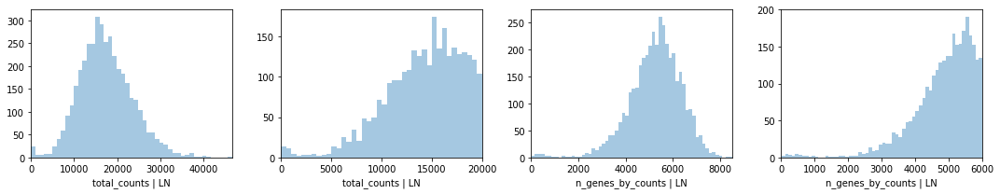

In [7]:
# PLOT QC FOR EACH SAMPLE 
if len(slides) > 2:
    figsize = 4*len(slides)-4
else:
    figsize = 4*len(slides)-1
    
fig, axs = plt.subplots(len(slides), 4, figsize=(15, figsize))
axs = axs.reshape((len(slides), 4))
for i in range(len(slides)):
    #fig.suptitle('Covariates for filtering')
    
    sns.distplot(list(slides.values())[i].obs['total_counts'], 
                 kde=False, ax = axs[i, 0])
    axs[i, 0].set_xlim(0, adata.obs['total_counts'].max())
    axs[i, 0].set_xlabel('total_counts | ' + list(slides.keys())[i])
    
    sns.distplot(list(slides.values())[i].obs['total_counts']\
                 [list(slides.values())[i].obs['total_counts']<20000],
                 kde=False, bins=40, ax = axs[i, 1])
    axs[i, 1].set_xlim(0, 20000)
    axs[i, 1].set_xlabel('total_counts | ' + list(slides.keys())[i])
    
    sns.distplot(list(slides.values())[i].obs['n_genes_by_counts'],
                 kde=False, bins=60, ax = axs[i, 2])
    axs[i, 2].set_xlim(0, adata.obs['n_genes_by_counts'].max())
    axs[i, 2].set_xlabel('n_genes_by_counts | ' + list(slides.keys())[i])
    
    sns.distplot(list(slides.values())[i].obs['n_genes_by_counts']\
                 [list(slides.values())[i].obs['n_genes_by_counts']<6000],
                 kde=False, bins=60, ax = axs[i, 3])
    axs[i, 3].set_xlim(0, 6000)
    axs[i, 3].set_xlabel('n_genes_by_counts | ' + list(slides.keys())[i])
    
plt.tight_layout()

... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'SYMBOL' as categorical


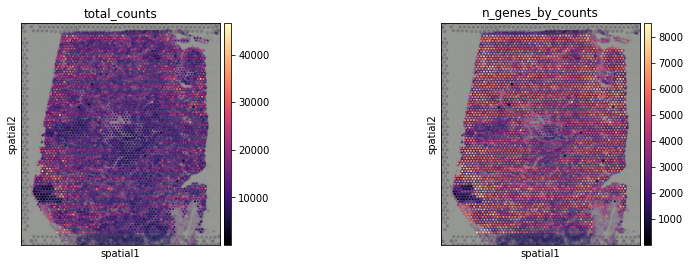

In [8]:
sc.pl.spatial(slides['LN'], img_key = "hires", cmap='magma',
              color=['total_counts', 'n_genes_by_counts'],
              gene_symbols='SYMBOL')

Here we show how to use scanpy to plot results over histology section using anndata object from one section, and 

In [0]:
# flip the image vertically
#adata.obsm['X_spatial'][:,1] = -adata.obsm['X_spatial'][:,1]

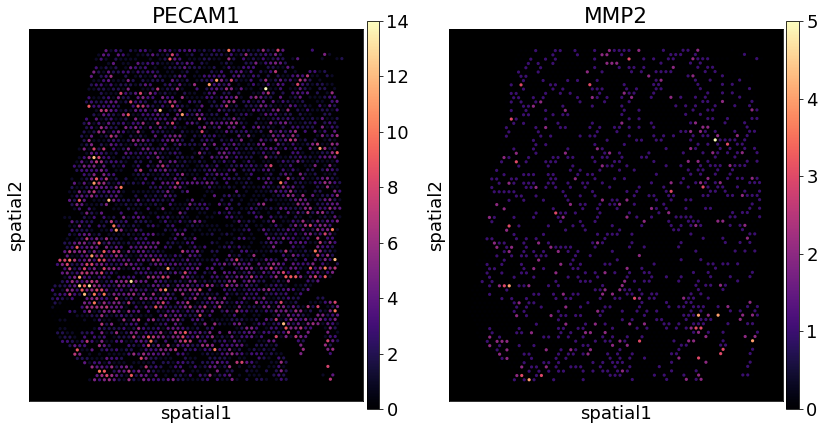

In [10]:
rcParams["axes.facecolor"] = "black"
rcParams["figure.figsize"] = [6,7]
rcParams["font.size"] = 18

sc.pl.spatial(adata, 
              color=["PECAM1", "MMP2"], img_key='hires', alpha_img=0,
              vmin=0, cmap='magma', #vmax=3.8,
              gene_symbols='SYMBOL'
             )

# Load the data from ArrayExpress
!cd /nfs/team205/vk7/sanger_projects/cell2location/notebooks/data/b_t_cells_tonsils_hk/ && wget https://www.ebi.ac.uk/arrayexpress/files/E-MTAB-9005/E-MTAB-9005.processed.2.zip
!cd /nfs/team205/vk7/sanger_projects/cell2location/notebooks/data/b_t_cells_tonsils_hk/ && unzip E-MTAB-9005.processed.2.zip -d ./rawdata

!cd /nfs/team205/vk7/sanger_projects/cell2location/notebooks/data/b_t_cells_tonsils_hk/ && wget https://www.ebi.ac.uk/arrayexpress/files/E-MTAB-9005/E-MTAB-9005.processed.1.zip
!cd /nfs/team205/vk7/sanger_projects/cell2location/notebooks/data/b_t_cells_tonsils_hk/ && unzip E-MTAB-9005.processed.1.zip 

# untar expression matrices
files = glob.glob(sc_data_folder + "rawdata/*.gz")

for i in files:
    os.system('cd ' + sc_data_folder + 'rawdata/ ' + '&& tar -xvzf ' + i)

In [0]:
adata_vis = adata.copy()
adata_vis.raw = adata_vis
adata_vis.obs['sample'] = 'LN'

In [0]:
# read single cell data

mtx_files = glob.glob(sc_data_folder + "rawdata/*/*.mtx*")
cell_files = glob.glob(sc_data_folder + "rawdata/*/*barcodes*")
gene_files = glob.glob(sc_data_folder + "rawdata/*/*features*")

# read gene names
gene_id = pd.read_csv(gene_files[0], header=None, sep='\t')
gene_id = gene_id.drop(columns=[2])
gene_id = gene_id.rename(columns={0: 'ENSEMBL', 1: 'SYMBOL'})
gene_id.index = gene_id['ENSEMBL']
gene_id = gene_id.drop(columns='ENSEMBL')

adatas = []
for i, f in enumerate(mtx_files):
    adata = anndata.read_mtx(f).T
    cell_id = pd.read_csv(cell_files[i], header=None)
    cell_id.columns = ['cell_id']
    adata.obs_names = cell_id['cell_id']
    
    adata.var = gene_id
    adata.var_names = gene_id.index
    
    adatas.append(adata)
    
sample_names = [sub('(^.+rawdata/)|_filter.+$', '', i) for i in mtx_files]
adata_snrna_raw = adatas[0].concatenate(adatas[1:], batch_key='sample', 
                                        batch_categories=sample_names)

# filter cells and genes
sc.pp.filter_cells(adata_snrna_raw, min_genes=200)
sc.pp.filter_genes(adata_snrna_raw, min_cells=10)

# modify cell names to match annotations
adata_snrna_raw.obs['sample_id'] = ['BCP' + i[5:6] for i in adata_snrna_raw.obs['sample']]
adata_snrna_raw.obs['sort'] = [sub('_.+$', '', i[7:]) for i in adata_snrna_raw.obs['sample']]
adata_snrna_raw.obs['cell_barcode'] = [i[:16] for i in adata_snrna_raw.obs_names]

adata_snrna_raw.obs_names = adata_snrna_raw.obs['sample_id'] + '_' \
                                + adata_snrna_raw.obs['sort'] + '_' \
                                + adata_snrna_raw.obs['cell_barcode']

# read cell annotations
cell_anno = pd.read_csv(sc_data_folder + 'CellTypeMetaData.txt', sep='\t', index_col='barcode')
cell_anno = cell_anno.reindex(index = adata_snrna_raw.obs_names)

# add them to adata
adata_snrna_raw.obs[cell_anno.columns] = cell_anno

In [13]:
# remove unannotated cells
adata_snrna_raw = adata_snrna_raw[~adata_snrna_raw.obs['Lineage'].isna(), :]

# remove
adata_snrna_raw = adata_snrna_raw[~adata_snrna_raw.obs['sample_id'].isin(['BCP2', 'BCP6']), :]

adata_snrna_raw

View of AnnData object with n_obs × n_vars = 30705 × 19446 
    obs: 'sample', 'n_genes', 'sample_id', 'sort', 'cell_barcode', 'Lineage', 'CellType', 'Subset', 'MBC_Subset'
    var: 'SYMBOL', 'n_cells'

Add counts matrix as `adata.raw` 

In [0]:
adata_snrna_raw.raw = adata_snrna_raw

We need to make sure gene IDs on both spatial and reference objects are of the same type.

## 2. Show UMAP of cells and locations

In [0]:
sc.pp.log1p(adata_snrna_raw)
sc.tl.pca(adata_snrna_raw, svd_solver='arpack', n_comps=70, use_highly_variable=False)
sc.pp.neighbors(adata_snrna_raw, n_neighbors = 100, n_pcs = 50)
sc.tl.umap(adata_snrna_raw, min_dist = 0.2, spread = 4)

In [0]:
rcParams['figure.figsize'] = 10, 10
rcParams["axes.facecolor"] = "white"
sc.pl.umap(adata_snrna_raw, color=["sample_id", "sort", 'Lineage', 'CellType', 'Subset'],
           color_map = 'RdPu', ncols = 2, #legend_loc='on data',
           legend_fontsize=10, palette=sc.pl.palettes.default_102)

In [0]:
anno_counts = pd.DataFrame(adata_snrna_raw.obs['Subset'].value_counts())
anno_counts.reset_index(inplace=True)
anno_counts.columns = ["annotation", "counts"]
anno_counts['log10_counts'] = np.log10(anno_counts['counts'])

rcParams["font.size"] = 18
rcParams["figure.figsize"] = [7,13]
sns.barplot(data=anno_counts, y='annotation', x='log10_counts', 
#             order= anno_counts.sort_values("counts", ascending=False).annotation,
            orient="h", palette=sc.pl.palettes.default_102)

Now we look at the UMAP of Visium spots

In [0]:
sc.tl.pca(adata_vis, svd_solver='arpack', n_comps=50)
sc.pp.neighbors(adata_vis, n_neighbors = 100, n_pcs = 50)
sc.tl.umap(adata_vis, min_dist = 0.2, spread = 4)

rcParams['figure.figsize'] = 10, 10
rcParams["axes.facecolor"] = "white"
sc.pl.umap(adata_vis, #color=['sample'],
           color_map = 'RdPu', ncols = 1, legend_loc='on data',
           legend_fontsize=10)

# 3. cell2location analysis in one step

Here we perform the first step in one function run - train cell2location model to learn cell locations. Results are shown below and saved to:  

In [15]:
if not os.path.exists(results_folder + 'std_model/'):
    os.mkdir(results_folder + 'std_model/')
results_folder + 'std_model/'

'/content/gdrive/My Drive/google_colab/cell2location/results/std_model/'

### Summarising single cell clusters ###
### Creating pymc3 model ### - time 0.02 min
### Analysis name: LocationModelV7_V4_V4_32clusters_4039locations_19446genes
### Training model ###


Average Loss = 5.0941e+07: 100%|██████████| 15000/15000 [09:03<00:00, 27.59it/s]
Finished [100%]: Average Loss = 5.0941e+07


Average Loss = 5.0941e+07: 100%|██████████| 15000/15000 [09:03<00:00, 27.58it/s]
Finished [100%]: Average Loss = 5.094e+07


None
None
None
### Sampling posterior ### - time 18.94 min
### Ploting posterior of W / cell locations ###


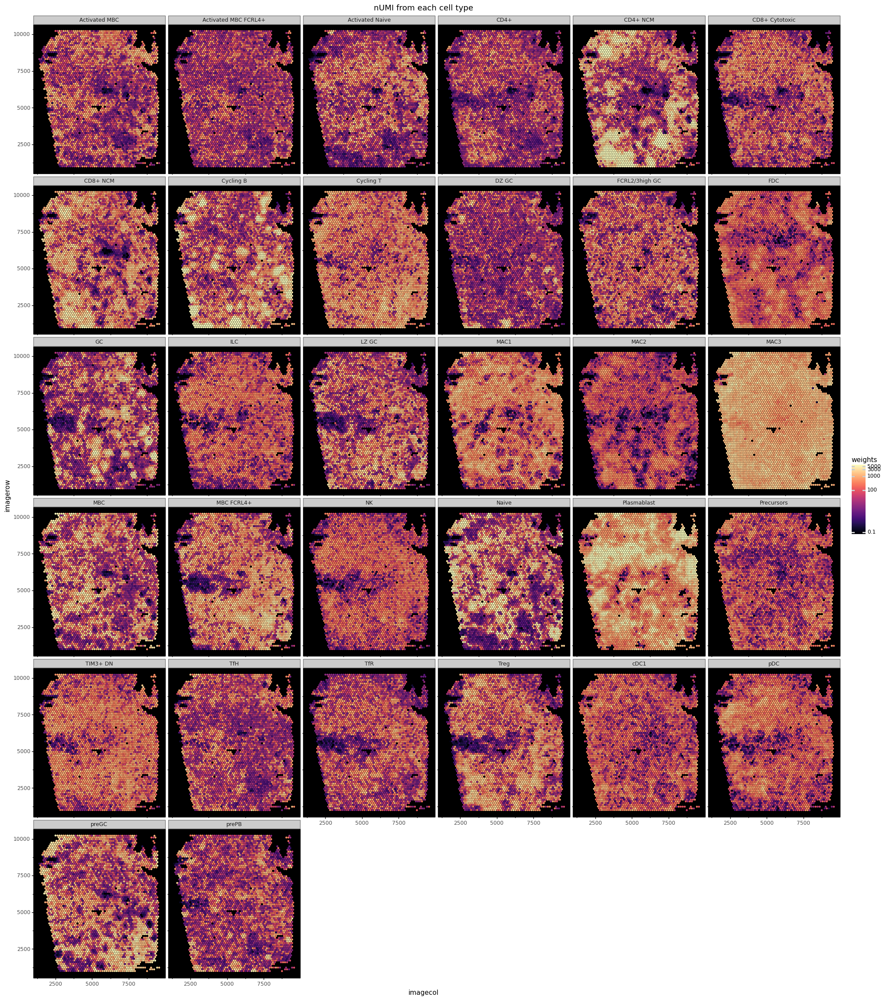

<ggplot: (-9223363277980941154)>
### Saving results ###


... storing 'sample' as categorical


### Done ### - time 20.38 min


In [16]:
r = pycell2location.run_cell2location(
                      sc_data=adata_snrna_raw, 
                      sp_data=adata_vis,
                      model_name='LocationModelV7_V4_V4',
                      verbose=True, return_all=True,
                      
                      summ_sc_data_args={'cluster_col': "Subset",
                                         'which_genes': "intersect",
                                         'selection': None, # high_cv None
                                         'select_n': 10000, 'select_n_AutoGeneS': 1000},
                                      
                      train_args={'mode': "normal",'use_raw': True, 'data_type': "float32",
                                  'n_iter': 15000, 'learning_rate': 0.005,
                                  'total_grad_norm_constraint': 200,
                                  'sample_prior': False, # set to false for large spatial data 
                                  'n_restarts': 2, 'n_type': "restart",
                                  'tracking_every': 1000, 'tracking_n_samples': 50,
                                  'readable_var_name_col': "SYMBOL",
                                  'sample_name_col': 'sample', 'fact_names': None},
                                      
                      posterior_args={'n_samples': 100, 'evaluate_stability_align': False,
                                      'mean_field_slot':"init_1"},
                                      
                      export_args={'path': results_folder + 'std_model/', 
                                   'plot_extension':"png",
                                   'sp_sample_name_col': 'sample', 
                                   'save_model': False, # not saving the model to avoid extra memory usage
                                   'run_name_suffix': '',
                                   'scanpy_coords_name': 'X_spatial',
                                    'export_q05': True},
                      model_kwargs={'cell_number_prior': {'cells_per_spot': 30, 'factors_per_spot': 8,
                                                    'cells_mean_var_ratio': 0.5, 'factors_mean_var_ratio': 1},
                                           'gene_level_prior':{'mean': 1/3, 'sd': 1/9, 'mean_var_ratio': 1}})

Trained model object can be pulled from `r['mod']`, cell locations are added to `r['sp_data']` as columns of `sp_data.obs` and all paramters of the model are exported to `sp_data.uns['mod']`. This anndata object and a csv file `W.csv` / `W_q05.csv` with cell locations are always saved to the results directory. 

When `'save_model': True`, the trained model `r['mod']` is also saved as a pickle file. You can load the model later and continue training. 

#### Evaluating training

Now we need to check if our model has trained successfully by looking at the loss / cost function over training iterations. This plot omits the first 20% of training iterations during which loss changes by orders of magnitude.

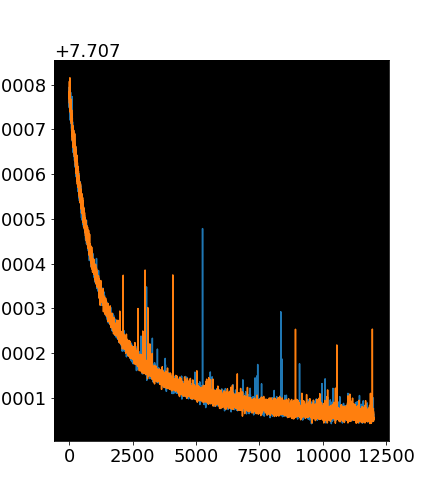

In [17]:
from IPython.display import Image
Image(filename=results_folder + 'std_model/'+r['run_name']+'/plots/training_history_without_first_20perc.png',
      width=400)

We also need to evaluate the reconstruction accuracy or how well cell types and uniform background explain spatial data bu comparing expected value of the model (Poisson mean) to observed count of each gene across locations. The ideal case is perfect diagonal plot.

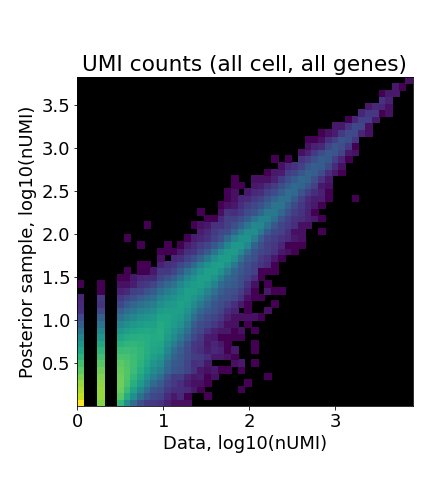

In [18]:
Image(filename=results_folder + 'std_model/'+r['run_name']+'/plots/data_vs_posterior_mean_Poisson_rate.png',
      width=400)

Finally, we need to evaluate robustness of the identified locations by comparing consistency of inferred locations between two independent training restarts.

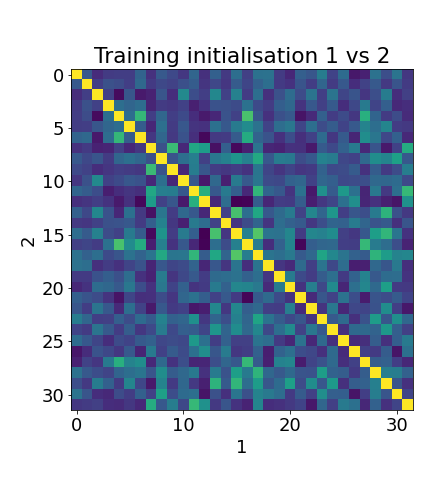

In [19]:
Image(filename=results_folder + 'std_model/'+r['run_name']+'/plots/evaluate_stability.png',
      width=400)

#### Loading saved results

We can load our model and associated object after training (this also needs a GPU to be available and we need to know the analysis name):

In [0]:
pickle_model = results_folder + 'std_model/LocationModelV7_V4_V4_32clusters_4039locations_19446genes/model_.p'
r = pickle.load(open(pickle_model, "rb"))

In [0]:
adata_vis = r['sp_data']

Alternatively we can load the results of the model saved into `sp_data`:

In [0]:
# remove previous data objects to save memory
del adata_vis
del adata_snrna_raw

In [0]:
sp_data_file = results_folder + 'std_model/LocationModelV7_V4_V4_32clusters_4039locations_19446genes/sp.h5ad'
adata_vis = anndata.read(sp_data_file)

#### Advanced plotting of cell locations

Alternatively we can visualise locations of multiple cell types at once using a plotting tool from cell2location package.

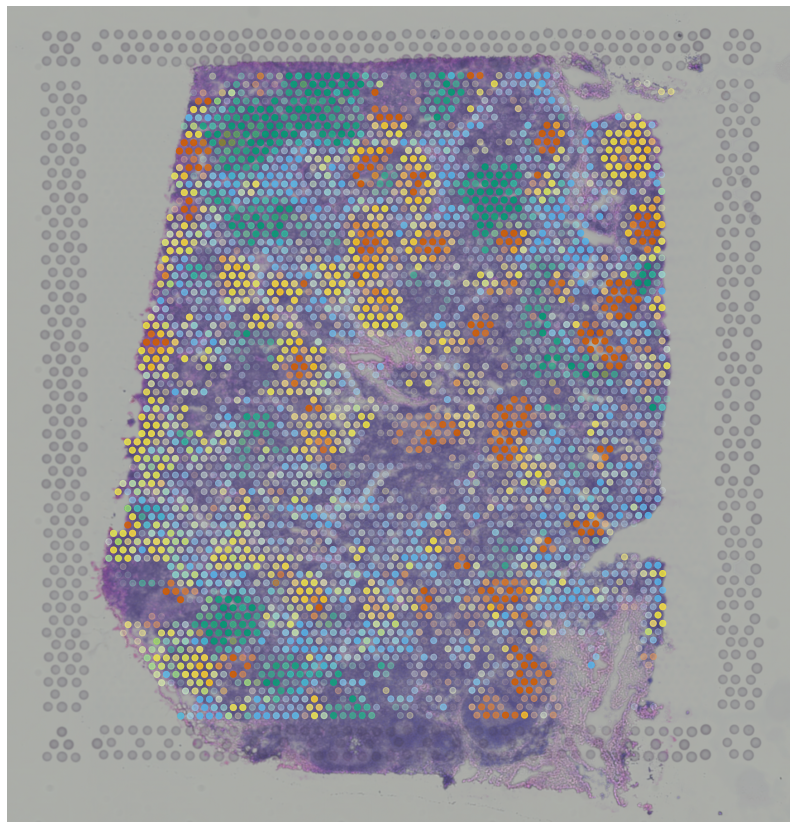

In [22]:
from pycell2location.plt.mapping_video import plot_contours

# select up to 6 clusters 
sel_clust = ['Naive', 'GC', 'MAC1', 'CD4+ NCM']
sel_clust_col = ['mean_nUMI_factors' + str(i) for i in sel_clust]
#sel_clust_col = ['q05_nUMI_factors' + str(i) for i in sel_clust]
s = 'LN'

rcParams["figure.figsize"] = [15,15]
plot_contours(adata_vis.obs[sel_clust_col], 
              coords=adata_vis.obsm['X_spatial'] \
                      * adata_vis.uns['scalefactors']['tissue_hires_scalef'], 
              show_img=True, img_alpha=0.8,
              img=adata_vis.uns['images']['hires'],
              circle_diameter=6, alpha_scaling=0.6)

Now we plot the 5% quantile of the posterior distribution on the number of UMI which shows the location only when the model has high confidence.

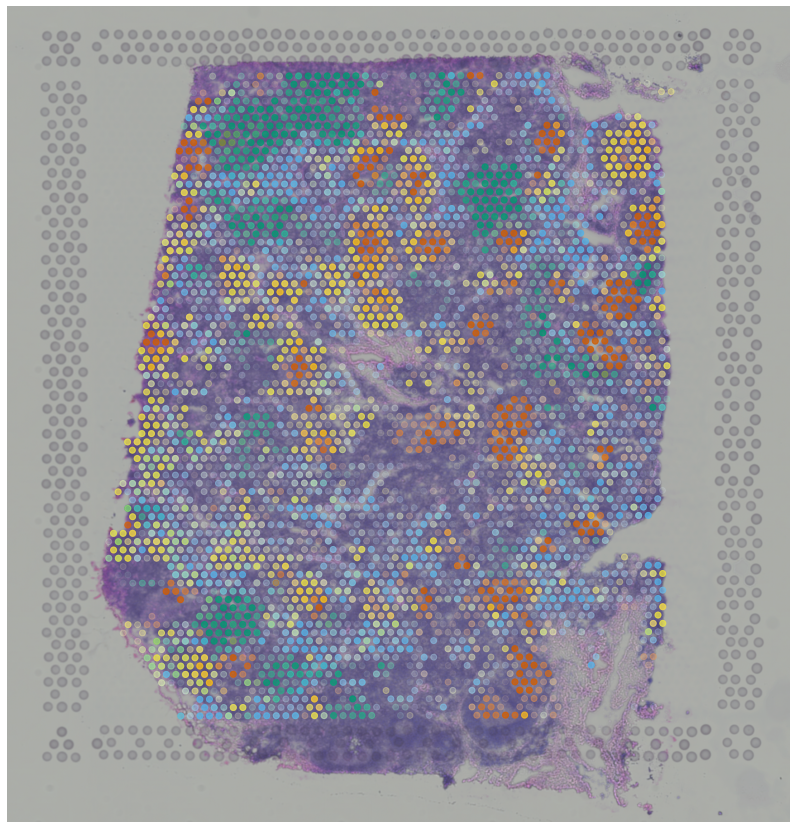

In [23]:
rcParams["figure.figsize"] = [15,15]
sel_clust_col = ['q05_nUMI_factors' + str(i) for i in sel_clust]
plot_contours(adata_vis.obs[sel_clust_col], 
              coords=adata_vis.obsm['X_spatial'] \
                      * adata_vis.uns['scalefactors']['tissue_hires_scalef'], 
              show_img=True, img_alpha=0.8,
              img=adata_vis.uns['images']['hires'],
              circle_diameter=6, alpha_scaling=0.5)

Here we use standard scanpy pipeline to plot cell locations over histology images:

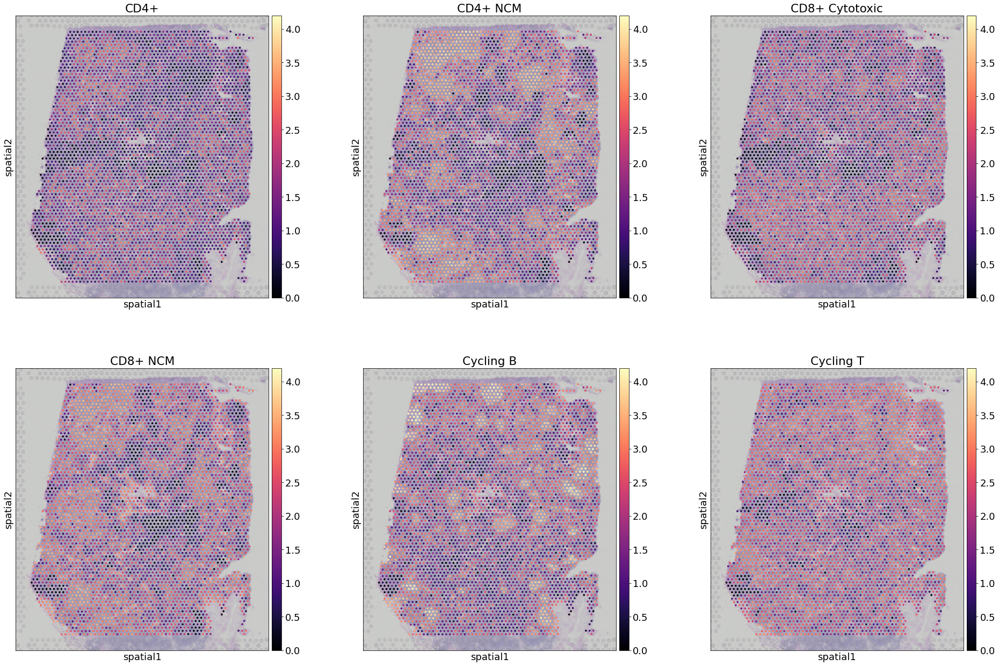

In [24]:
rcParams["axes.facecolor"] = "white"
rcParams["figure.figsize"] = [10,10]
rcParams["font.size"] = 18

s = 'LN'
sel_clust_col = ['q05_nUMI_factors' in i for i in adata_vis.obs.columns]
sel_clust_col = adata_vis.obs.columns[sel_clust_col]
from re import sub # create nice names
sel_clust = [sub('q05_nUMI_factors', '', i) for i in sel_clust_col]

# log-transform and save with nice names
adata_vis.obs[sel_clust] = np.log10(adata_vis.obs[sel_clust_col])

sc.pl.spatial(adata_vis, cmap='magma',
              color=sel_clust[3:9], # limit size in this notebook
              ncols=3, 
              size=0.8, img_key='hires', 
              alpha_img=0.5,
              vmin=0, vmax=4.2
             )

## 4. Automatic discrete region identification by clustering cell densities
We find regions by clustering spots based on inferred molecule contributions of each cell type. We use leiden clustering that incorporates the similarity of spots in cell locations. Results are saved in `adata_vis.obs['leiden']`.

In [0]:
sample_type = 'q05_nUMI_factors'
col_ind = [sample_type in i for i in adata_vis.obs.columns.tolist()]
adata_vis.obsm[sample_type] = adata_vis.obs.loc[:,col_ind].values

# compute KNN using the cell2location output
sc.pp.neighbors(adata_vis, use_rep=sample_type,
                n_neighbors = 38)

In [0]:
# Cluster spots into regions using scanpy
sc.tl.leiden(adata_vis, resolution=1)

In [0]:
adata_vis.obs["region_cluster"] = adata_vis.obs["leiden"]
adata_vis.obs["region_cluster"] = adata_vis.obs["region_cluster"].astype("category")

Since the clustering is done jointly, the cluster identities match between sections.

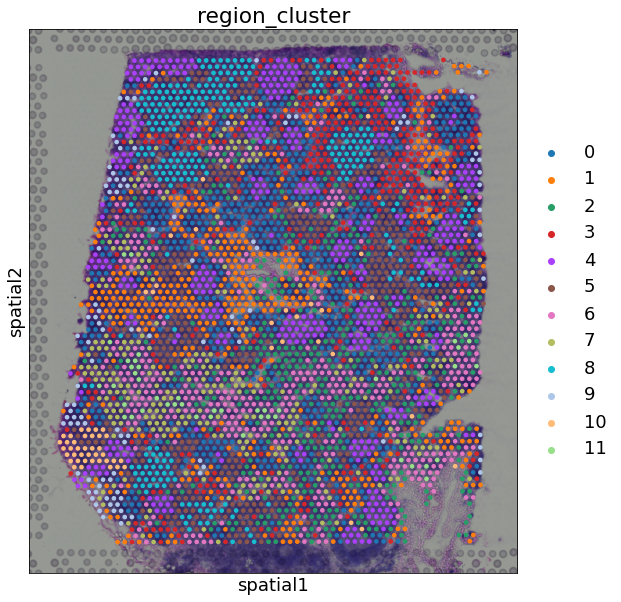

In [31]:
rcParams["figure.figsize"] = [10, 10]
#rcParams["axes.facecolor"] = "white"
sc.pl.spatial(adata_vis, 
              color=["region_cluster"], img_key='hires',
            );

### Export regions for import to 10X Loupe Browser

In [0]:
# add binary labels for each region
region_cluster_bin = adata_vis.obs[['region_cluster']]
# save maps for each sample separately
sam = np.array(adata_vis.obs['sample'])

for i in np.unique(sam):
    
    s1 = region_cluster_bin
    s1 = s1.loc[sam == i]
    s1.index = [x[10:] for x in s1.index]
    s1.index.name = 'Barcode'
    
    s1.to_csv(results_folder + 'std_model/LocationModelV7_V4_V4_32clusters_4039locations_19446genes'\
              +'/region_cluster29_' + i + '.csv')

## 5. Visualize cell type density gradients using diffusion maps

Here we use the diffusion maps approach to visualize cell type density gradients. This allows describing how cell composition of spots transitions as you move through the tissue and shows which tissue regions are connected in terms of their cell composition.

In [0]:
sc.tl.diffmap(adata_vis)

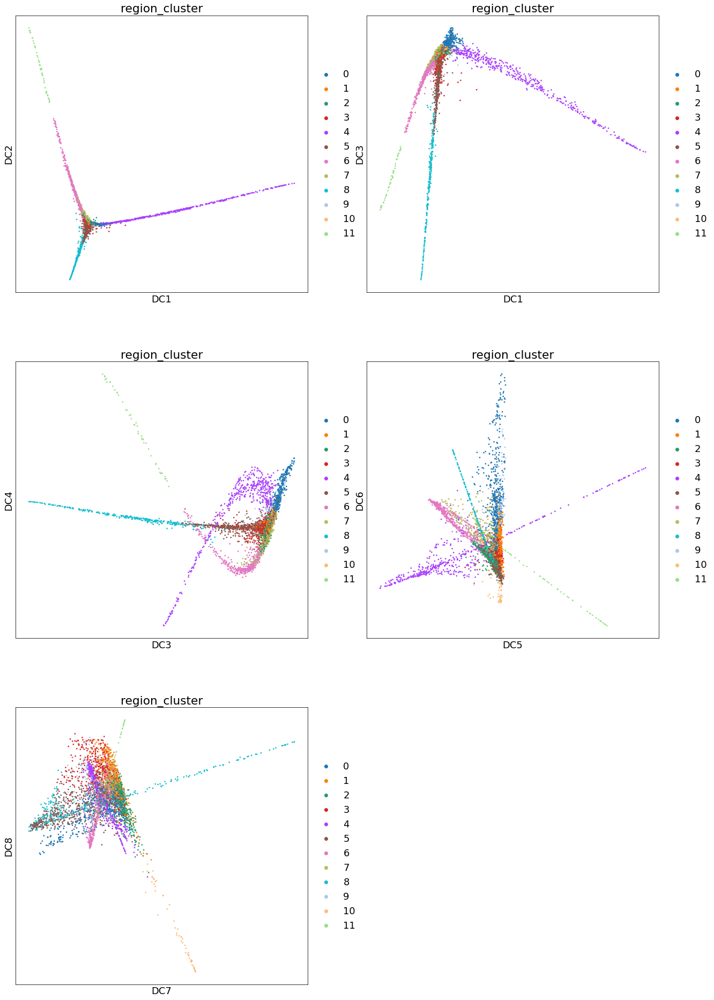

In [37]:
rcParams["axes.facecolor"] = "white"
rcParams["figure.figsize"] = [10,10]
sc.pl.diffmap(adata_vis, color=['region_cluster'],
              components=['1,2', '1,3', '3,4', '5,6', '7,8'], ncols=2)

Modules and their versions used for this analysis

In [38]:
import sys
for module in sys.modules:
    try:
        print(module,sys.modules[module].__version__)
    except:
        try:
            if  type(modules[module].version) is str:
                print(module,sys.modules[module].version)
            else:
                print(module,sys.modules[module].version())
        except:
            try:
                print(module,sys.modules[module].VERSION)
            except:
                pass

re 2.2.1
ipykernel 4.10.1
ipykernel._version 4.10.1
json 2.0.9
IPython 5.5.0
IPython.core.release 5.5.0
logging 0.5.1.2
zlib 1.0
traitlets 4.3.3
six 1.12.0
ipython_genutils 0.2.0
ipython_genutils._version 0.2.0
platform 1.0.8
traitlets._version 4.3.3
decorator 4.4.2
argparse 1.1
pygments 2.1.3
pexpect 4.8.0
ptyprocess 0.6.0
pkg_resources._vendor.six 1.10.0
pkg_resources.extern.six 1.10.0
pkg_resources._vendor.appdirs 1.4.3
pkg_resources.extern.appdirs 1.4.3
pkg_resources._vendor.packaging 16.8
pkg_resources._vendor.packaging.__about__ 16.8
pkg_resources.extern.packaging 16.8
pkg_resources._vendor.pyparsing 2.2.1
pkg_resources.extern.pyparsing 2.2.1
pickleshare 0.7.5
prompt_toolkit 1.0.18
optparse 1.5.3
jupyter_client 5.3.4
jupyter_client._version 5.3.4
zmq 19.0.0
ctypes 1.1.0
_ctypes 1.1.0
zmq.backend.cython 40302
zmq.backend.cython.constants 40302
zmq.sugar 19.0.0
zmq.sugar.constants 40302
zmq.sugar.version 19.0.0
jupyter_core 4.6.3
jupyter_core.version 4.6.3
distutils 3.6.9
_curses b